# # Advanced Lane finding.

Goal of the project is to find lanes for a given image/video using advanced
techniques thought in course work.
Camera calibration and distortion techniques are used with sample images
and applied on lane images. Images are modified to get a top-down view.
This project uses Sobel gradients, HSV color schems to make lane detection easy.
Lane lines are detected using sliding window approch. Once lane lines
are found radius curvature and distance from center are detected to
understand and further refine the process.  

Here are the steps used in this solution:
1) Calibrate and undistort images by using sample chess pictures.
2) Warp the image.
3) Apply gradients (sobel threshold x-axis, magnitude and directional thresholds)
4) Apply HSV color schems to capture and reduce noise (HLS_S and HLS_L schemes are applied)
5) Select sample area of the image to warp the image.
6) Apply sliding window techniques.
6.1) Sliding window centroid: The goal was to utilize this approch as it proved
effective on images. My implementation had issues with it and the right lane
is drifting away. Approch removed from final project.
6.2) Sliding window polyfit: To get the initial points of lanes a histogram is
used and base points are detected. Next sliding rectangle windows are applied
and collet all non-zero pixels in the rectangle to better polyfit the lines.
This worked well.
7) Calcuate radius curvature and distance from center based on the lines found.
8) Test on all sample images.
9) Test on videos. 
10) Repeat 3 to 9 based on testing.


In [116]:
import os
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pdb
import pickle
from moviepy.editor import VideoFileClip
%matplotlib inline


In [117]:
# Plot images utility
def plot_images(imgs, labels, rows=1, cols=3):
    """ 
    Plot images in rowXcol format.
    imgs: List of images to display.
    lables: List of lables for the images to display
    """
    display_imgs = imgs
    display_labels = labels
    fig, axis = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 20))
    axis = axis.ravel()
    for index in range(len(display_imgs)):
        img = display_imgs[index]
        if ((not isinstance(img, tuple)) and
            (len(img.shape) == 3 and img.shape[2] == 1)):
            img = np.squeeze(img, axis=(2,))

        axis[index].imshow(img, cmap='gray')
        axis[index].set_title(display_labels[index], fontsize=20)
    plt.tight_layout()

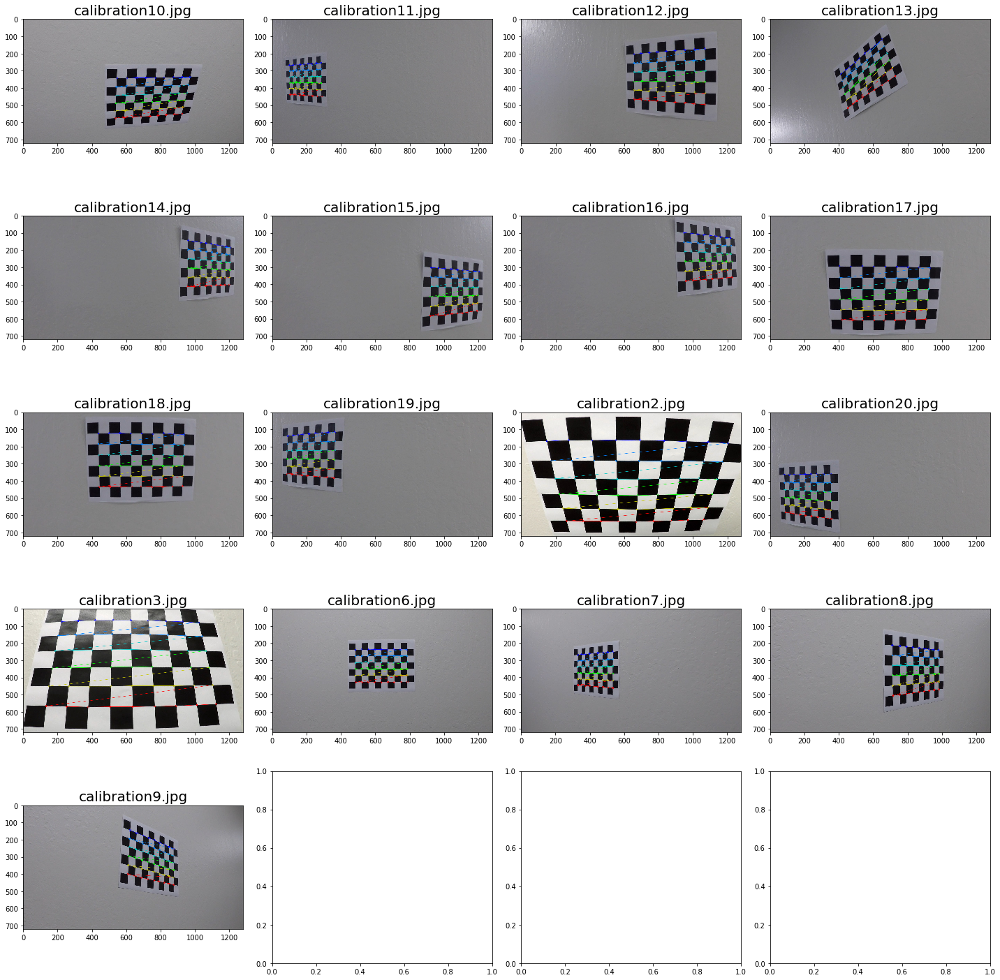

In [118]:
# Get Object and Image points from given chess board images to undisort
# images and warp.

# Get a list of images to calibrate.
images = glob.glob('./camera_cal/*.jpg')
nx = 9
ny = 6
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
obj_points = [] 
img_points = [] 
final_imgs = []
labels = []

# Search chessboard corners for every image.
for i, fname in enumerate(images):
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, add object points, image points
    if ret:
        obj_points.append(objp)
        img_points.append(corners)
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        final_imgs.append(img)
        labels.append(fname.split('/')[-1])
        
plot_images(final_imgs, labels, rows=5, cols=4)

In [119]:
def calibrate_undistort(img):
    """ Given an image and object, image points applies calibration and
    undistorts the image.
    """
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
        obj_points, img_points, gray.shape[::-1], None, None)
    undistort = cv2.undistort(img, mtx, dist, None, mtx) 
    return undistort

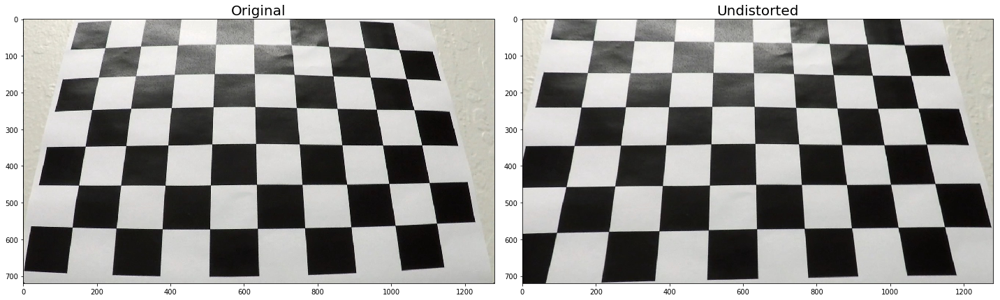

In [120]:
# Test calibration and undistortion.
# Take image 2 or 3 from above.
path = './camera_cal/calibration3.jpg'
chess_img = mpimg.imread(path)
undistort = calibrate_undistort(chess_img)

plot_images([chess_img, undistort], ["Original", "Undistorted"], rows=1, cols=2)

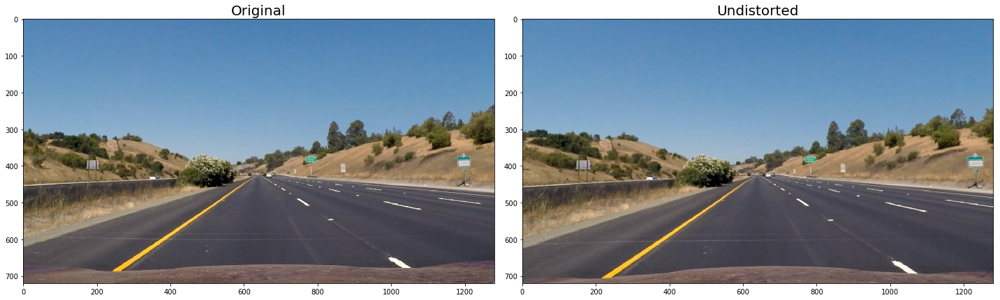

In [121]:

# Test on one of the sample images.
path = './test_images/straight_lines1.jpg'
orig = mpimg.imread(path)
undistort = calibrate_undistort(orig)

plot_images([orig, undistort], ["Original", "Undistorted"], rows=1, cols=2)

In [122]:
# Ref: http://www.pyimagesearch.com/2014/08/25/4-point-opencv-getperspective-transform-example/
def warp(img):
    h,w = img.shape[:2]
    # use cv2.getPerspectiveTransform() to get transform
    # Flip dest and src for inverse.
    p_trans = cv2.getPerspectiveTransform(src, dst)
    p_trans_inv = cv2.getPerspectiveTransform(dst, src)
    
    # Warp image for topdown view. ref: Udacity class.
    warped = cv2.warpPerspective(img, p_trans, (w,h), flags=cv2.INTER_LINEAR)
    return warped, p_trans, p_trans_inv

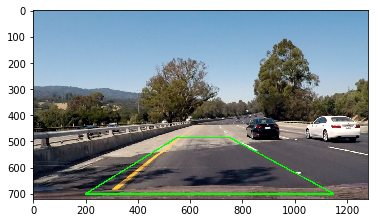

In [255]:
# Simple test to get src points.
#path = './test_images/straight_lines1.jpg'
path = './test_images/test4.jpg'
orig = plt.imread(path)
orig_cp = np.copy(orig)

src = np.array([[200, 700],
                  [550, 485],
                  [750, 485], 
                  [1150, 700]], np.float32)
cv2.polylines(orig_cp, [src.astype(int)], True, (0, 255, 0), 3)
plt.imshow(orig_cp)

Image Height: 720, Width: 1280


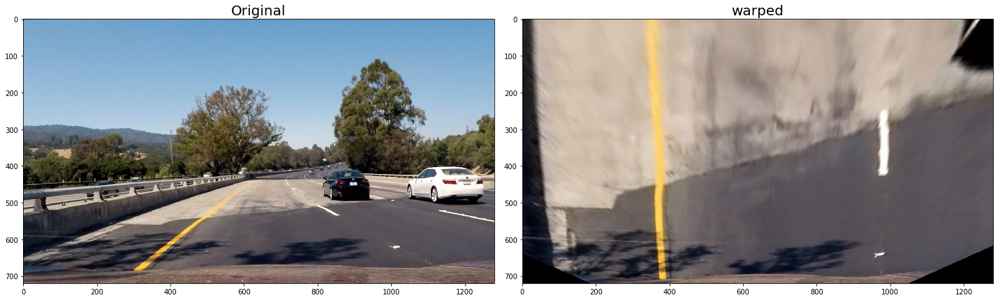

In [205]:
# Test warp
orig_h, orig_w = orig.shape[:2]
print("Image Height: %d, Width: %d" % (orig_h, orig_w))

offset = int(orig.shape[1]/4)
dst = np.array([(offset, orig_h),
                  (offset, 0),
                  (orig_w-offset, 0),
                  (orig_w-offset, orig_h)], np.float32)

orig_warp, p_trans, p_trans_inv = warp(orig)
plot_images([orig, orig_warp], ["Original", "warped"], rows=1, cols=2)

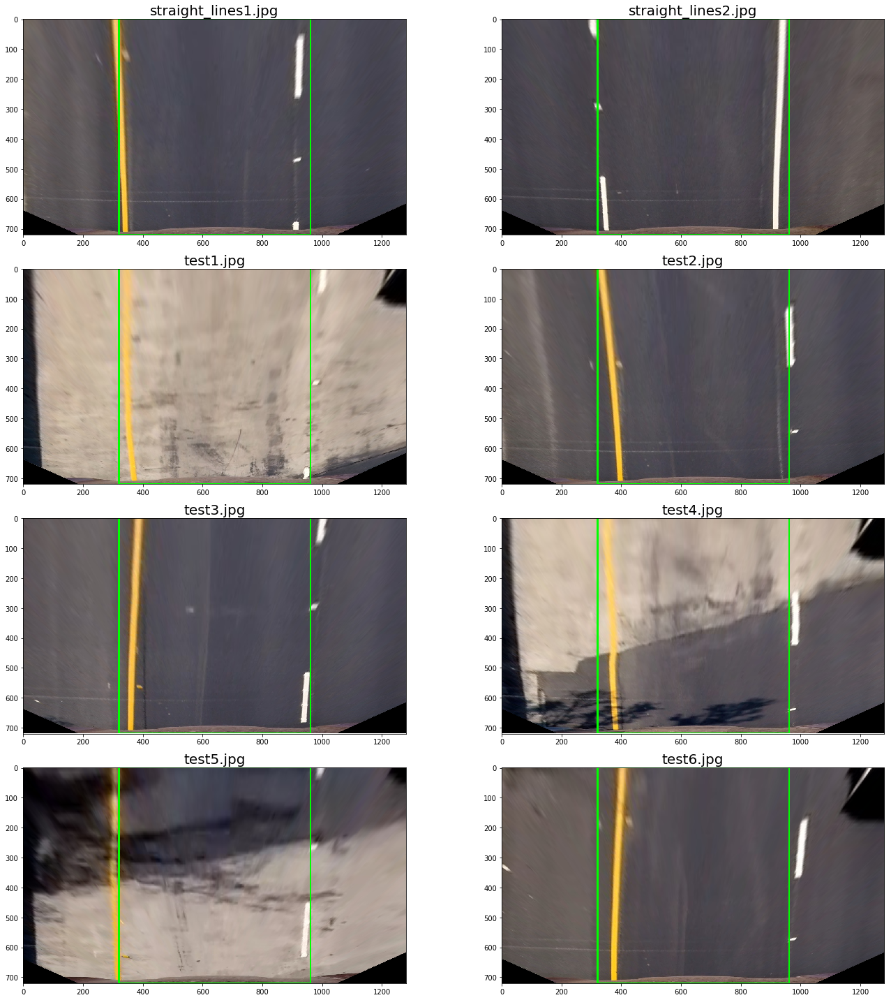

In [206]:
# Visualize the fitting on all images.

imgs = []
labels = []
test_images = glob.glob('./test_images/*.jpg')    
for i, fname in enumerate(test_images):
    orig = plt.imread(fname) 
    orig_warp, _, _ = warp(orig)
    orig_cp = np.copy(orig_warp)
    cv2.polylines(orig_cp, [dst.astype(int)], True, (0, 255, 0), 3)
    imgs.append(orig_cp)
    labels.append(fname.split('/')[-1])

plot_images(imgs, labels, rows=4, cols=2)

In [225]:
# Few more globals.
# Carry distance between lanes and delta
# between actual fit and dst.

lane_dist_px = dst[3][0]-dst[0][0] # Distance between x values of both lanes.
delta_px = 125 # Difference in actual fit VS expected fit in dst.
y_meters = 15 # Approximate distance of y in meters.

In [208]:
def abs_sobel_thresh(gray, orient='x', thresh_min=0, thresh_max=255):
    """ Applies sobel threshold for either X or Y orientation.
    Returns applied image.
    img: grayscale converted image.
    """
    # Apply the following steps to img
    # 1) Take the derivative in x or y given orient = 'x' or 'y'
    # 2) Take the absolute value of the derivative or gradient
    # 3) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 4) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 5) Return this mask as your binary_output image
    
    # 1
    use_x = 0
    use_y = 0
    if orient == 'x':
        use_x = 1
    if orient == 'y':
        use_y = 1
    
    # 2 abosulte value of derivative 
    sobel = cv2.Sobel(gray, cv2.CV_64F, use_x, use_y)
    abs_sobel = np.absolute(sobel)
    # 3
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel)) # Gets 0 or 1.
    
    #4 Mask of 1's
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sbinary

In [209]:
def mag_threshold(gray, sobel_kernel=3, mag_thresh=(0, 255)):

    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor)
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    return binary_output

In [210]:
def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate the x and y gradients
   sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
   sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
   # Take the absolute value of the gradient direction, 
   # apply a threshold, and create a binary image result
   absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
   binary_output =  np.zeros_like(absgraddir)
   binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
   return binary_output

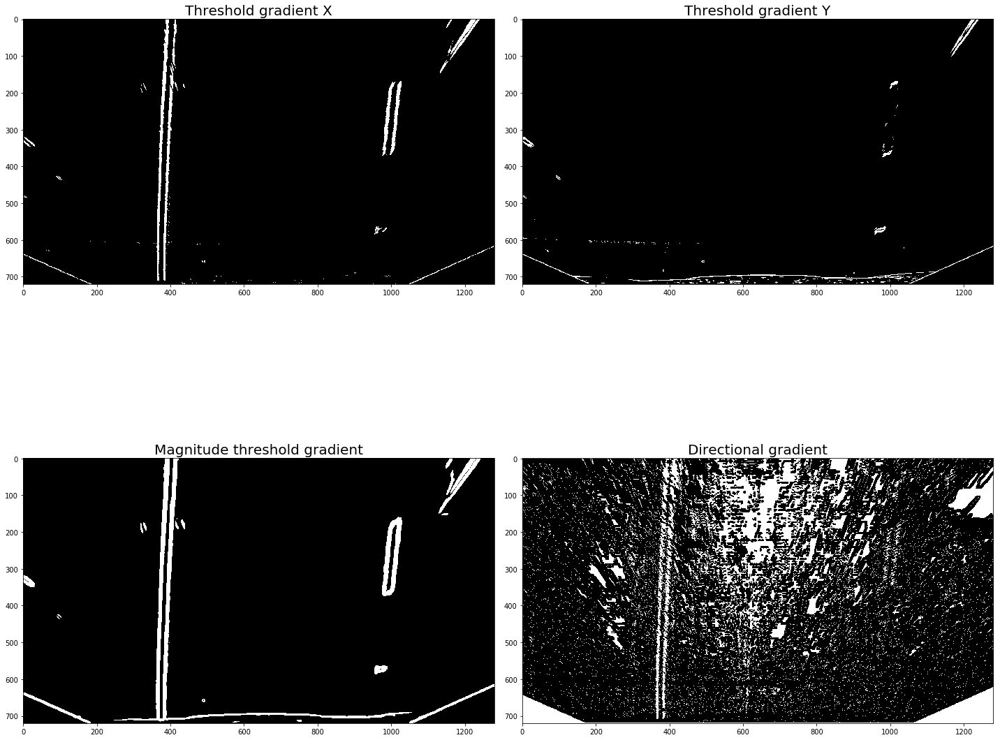

In [211]:
# Test individual gradients.
image_gray =  cv2.cvtColor(orig_warp, cv2.COLOR_RGB2GRAY)
images = []
labels = []
grad_binary_x_img = abs_sobel_thresh(image_gray, orient='x', thresh_min=30, thresh_max=255)
images.append(grad_binary_x_img)
labels.append("Threshold gradient X")

grad_binary_y_img = abs_sobel_thresh(image_gray, orient='y', thresh_min=30, thresh_max=255)
images.append(grad_binary_y_img)
labels.append("Threshold gradient Y")

mag_threshold_img = mag_threshold(image_gray, sobel_kernel=27, mag_thresh=(30, 255))
images.append(mag_threshold_img)
labels.append("Magnitude threshold gradient")

dir_threshold_img  = dir_threshold(image_gray, sobel_kernel=7, thresh=(0.0, 0.1))
images.append(dir_threshold_img)
labels.append("Directional gradient")
plot_images(images, labels, rows=2, cols=2)

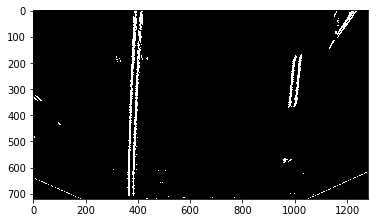

In [212]:
# Combining all gradients

combined = np.zeros_like(dir_threshold_img)
#combined[((grad_binary_x_img == 1) & (grad_binary_y_img == 1)) | ((mag_threshold_img == 1) & (dir_threshold_img == 1))] = 1
# Based on testing gradient for x and mag threshold seems to work best.
combined[(grad_binary_x_img == 1) | (mag_threshold_img == 1) & (dir_threshold_img == 1)] = 1
plt.imshow(combined, cmap='gray')


In [213]:
# HLS selection.
def hls_s(img, thresh=(127, 255)):
    """ For the given HLS color space, applied threshold on L
    and  returns S threshold value.
    """
    
    S = img[:,:,2]
    # Apply threshold on S only. As this seems best; Ref Udacity class 28.
    binary_s = np.zeros_like(S)
    binary_s[(S >= thresh[0]) & (S <= thresh[1])] = 1
    return binary_s

def hls_l(img, thresh=(127, 255)):
    """For the given HLS color space, applied threshold on L
    and returns L threshold value.
    """

    L = img[:,:,1]
    # Apply threshold on L only. As this seems best; Ref Udacity class 28.
    binary_l = np.zeros_like(L)
    binary_l[(L >= thresh[0]) & (L <= thresh[1])] = 1
    return binary_l

In [214]:
def image_pipeline(image):
    """
    Takes in raw image in RGB format and returns a binary image
    with all Sobel gradient and  selective HLS thresholds.
    """
    image_undistort = calibrate_undistort(image)
    warp_image, p_trans, p_trans_inv = warp(image_undistort)
    warp_gray = cv2.cvtColor(warp_image, cv2.COLOR_RGB2GRAY)
    
    grad_binary_x = abs_sobel_thresh(warp_gray, orient='x',
                                     thresh_min=30, thresh_max=255)
    
    m_threshold = mag_threshold(warp_gray, sobel_kernel=27,
                               mag_thresh=(30, 255))
    
    d_threshold  = dir_threshold(warp_gray, sobel_kernel=7,
                                   thresh=(0.0, 0.1))
    
    # Combine all gradients.
    combined_grad = np.zeros_like(d_threshold)
    combined_grad[(grad_binary_x == 1) &
                  (m_threshold == 1) & (d_threshold == 1)] = 1
    
    # Now HLS Selection.
    hsv = cv2.cvtColor(warp_image, cv2.COLOR_RGB2HLS).astype(np.float)
    
    s = hls_s(hsv, thresh=(127, 255))
    l = hls_l(hsv, thresh=(127, 255))
    
    combined_hsv = np.zeros_like(l)
    combined_hsv[(s == 1) & (l == 1)] = 1

    # Combine gradients and HLS selection.
    combined = np.zeros_like(combined_grad)
    combined[(combined_grad == 1) | (combined_hsv == 1)] = 1
    return combined, p_trans, p_trans_inv
        

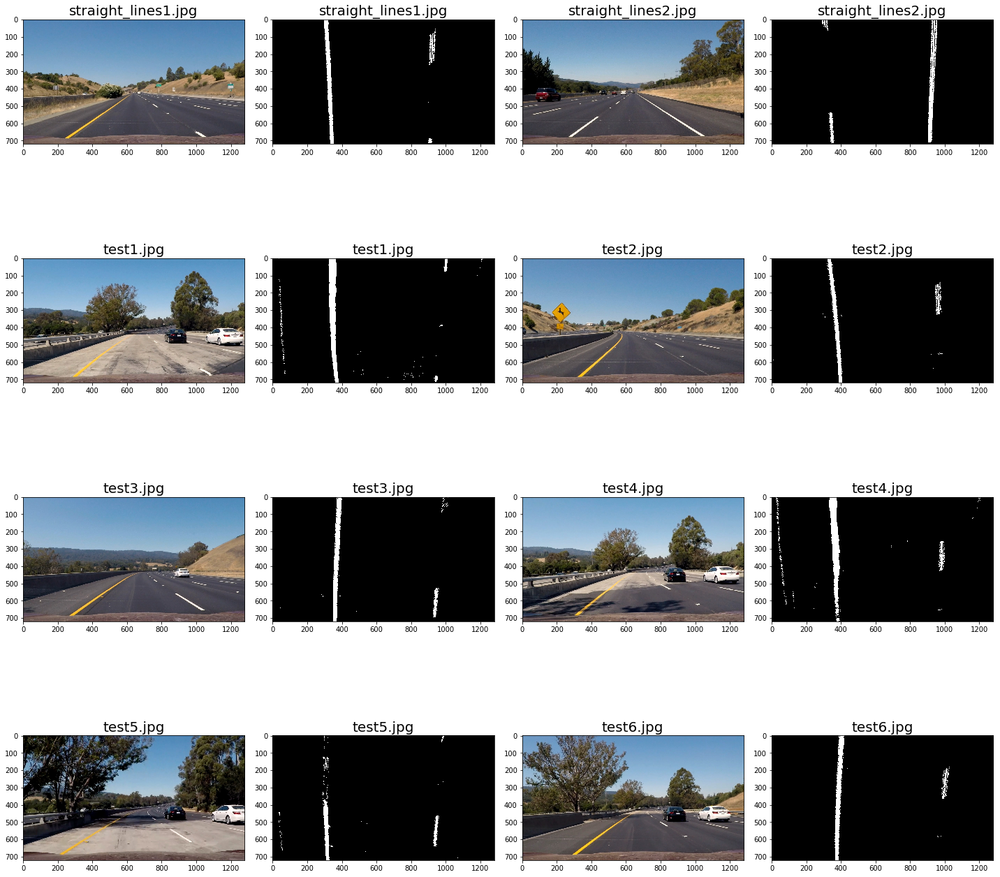

In [215]:

# Run image_pipeline on all test images.
test_images = glob.glob('./test_images/*.jpg')
images = []
labels = []
for i, fname in enumerate(test_images):
    orig = plt.imread(fname)
    images.append(orig)
    label = fname.split('/')[-1]
    labels.append(label)
    
    output, p_trans, p_trans_inv = image_pipeline(orig)
    images.append(output)
    labels.append(label)
# plot
plot_images(images, labels, rows=int(len(images)/4), cols=4)

In [216]:
# Use sliding search with convolution. Ref: Udacity class Chapter 34 (Advanced Lane Finding)
# TODO: Needs fix.
def sliding_window_centroids(warp_img, window_width=80, window_height=80, margin=50):
    """
    image : Image pre-processed; warp_img.
    window_width: Sliding window widht
    window_height: sliding window height
    margin: How much area to look for nearby.
    Performs sliding window technique using convolutions for finding hot pixels
    in given range. Returns left right fit and indices.
    """

    minpixels = 40 # To get all non-zero pixels in window.

    # Used for poly fit and visualization.
    left_lane_inds = []
    right_lane_inds = []
    rectangle_data = []
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warp_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # First find the two starting positions for the left and right lane
    # by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warp_img[int(3*warp_img.shape[0]/4):,
                                   :int(warp_img.shape[1]/2)], axis=0)
    l_center = np.int(np.argmax(np.convolve(window,l_sum))-window_width/2)
    r_sum = np.sum(warp_img[int(3*warp_img.shape[0]/4):,
                            int(warp_img.shape[1]/2):], axis=0)
    r_center = np.int(np.argmax(np.convolve(window,r_sum))-
                      window_width/2+int(warp_img.shape[1]/2))

    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warp_img.shape[0]/window_height)):
        # For the given L_center and R_center get rectangles
        # and L/R fits using non-zero values with-in range(rectangle).
        
        # Identify window boundaries in x and y (and right and left)
        # This is mostly for visuvalize later.
        win_y_low = img.shape[0] - (level+1)*window_height
        win_y_high = img.shape[0] - level*window_height
        win_xleft_low = l_center - margin
        win_xleft_high = l_center + margin
        win_xright_low = r_center - margin
        win_xright_high = r_center + margin
        
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, 
                               win_xleft_high, win_xright_low, win_xright_high))
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & 
                          (nonzeroy < win_y_high) &
                          (nonzerox >= win_xleft_low) & 
                          (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) &
                           (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) &
                           (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # Go on process for Current window to get next l_center and r_center.
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warp_img[int(warp_img.shape[0]-(level+1)*window_height):
                                    int(warp_img.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warp_img.shape[1]))
        l_center = np.int(np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset)
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warp_img.shape[1]))
        r_center = np.int(np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset)
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    # Draw lanes using polyfit with all the gatherd info.
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
        
    left_fit = None
    right_fit = None
    # Fit a second order polynomial only when there are pixels found.
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
        
    return left_fit, right_fit, left_lane_inds, right_lane_inds, rectangle_data

In [217]:
# Ref: Most of this code is from class and few with minor modifications.
def sliding_window_polyfit(img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
    
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    margin = 80
    # Expected minimum pixels in window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, 
                               win_xleft_high, win_xright_low, win_xright_high))
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & 
                          (nonzeroy < win_y_high) &
                          (nonzerox >= win_xleft_low) & 
                          (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) &
                           (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) &
                           (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
       
        # if found > minpix then use mean for current x and y.
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    
    # Fit a second order polynomial only when there are pixels found.
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    visualization_data = (rectangle_data, histogram)
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data

(720, 0)

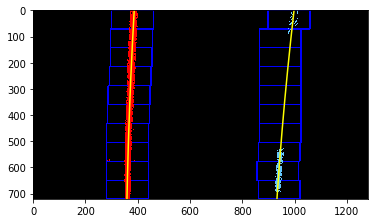

In [218]:
# Visualize

# visualize the result on example image
img = plt.imread('./test_images/test3.jpg')
img_b, p_trans, p_trans_inv = image_pipeline(img)
    
#left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = \
#        sliding_window_polyfit(img_b)

left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = \
        sliding_window_polyfit(img_b)

h = img.shape[0]
w = img.shape[1]
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]

rectangles = visualization_data[0]
histogram = visualization_data[1]

# Create an output image to draw on.
out_img = np.uint8(np.dstack((img_b, img_b, img_b))*255)

# Generate x and y values for plotting
ploty = np.linspace(0, img_b.shape[0]-1, img_b.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

for rect in rectangles:
# Draw the windows on the visualization image
    cv2.rectangle(out_img,(rect[2],rect[0]),
                  (rect[3],rect[1]),(0,0,255), 4) 
    cv2.rectangle(out_img,(rect[4],rect[0]),
                  (rect[5],rect[1]),(0,0,255), 4)
    
# Identify the x and y positions of all nonzero pixels in the image
nonzero = img_b.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, w)
plt.ylim(h, 0)

(0, 1280)

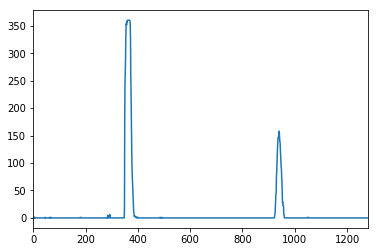

In [219]:
plt.plot(histogram)
plt.xlim(0, img.shape[1])

In [220]:
def polyfit_with_prev(binary_warped, left_fit_prev, right_fit_prev):
    """
    Given a binary image creates poly fit using previous values.
    Returns new left fit and right fit , left and right indices.
    """
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) +
                                   left_fit_prev[1]*nonzeroy + 
                                   left_fit_prev[2] - margin)) & 
                       (nonzerox < (left_fit_prev[0]*(nonzeroy**2) +
                                    left_fit_prev[1]*nonzeroy + 
                                    left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) +
                                    right_fit_prev[1]*nonzeroy +
                                    right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) +
                                    right_fit_prev[1]*nonzeroy +
                                    right_fit_prev[2] + margin)))  

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    
    if len(leftx) != 0:
        # Fit a second order polynomial
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
        
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

(720, 0)

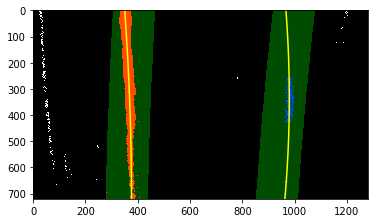

In [221]:

# On trying with various images; this seems to be best fit.
n_img = plt.imread('./test_images/test4.jpg')
n_img_bin, n_p_trans, n_p_trans_inv  = image_pipeline(n_img)   
margin = 80

n_left_fit, n_right_fit, n_left_lane_inds, n_right_lane_inds = polyfit_with_prev(
        n_img_bin, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, n_img_bin.shape[0]-1, n_img_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = n_left_fit[0]*ploty**2 + n_left_fit[1]*ploty + n_left_fit[2]
right_fitx2 = n_right_fit[0]*ploty**2 + n_right_fit[1]*ploty + n_right_fit[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((n_img_bin, n_img_bin, n_img_bin))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = n_img_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[n_left_lane_inds], nonzerox[n_left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[n_right_lane_inds], nonzerox[n_right_lane_inds]] = [0, 0, 255]

# Using old fit attempt to fit in new image.
n_left_line_window = np.array([np.transpose(
        np.vstack([left_fitx-margin, ploty]))])
n_left_line_window2 = np.array([np.flipud(np.transpose(
        np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((n_left_line_window, n_left_line_window2))

n_right_line_window = np.array([np.transpose(
        np.vstack([right_fitx-margin, ploty]))])
n_right_line_window2 = np.array([np.flipud(
        np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((n_right_line_window, n_right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, w)
plt.ylim(h, 0)

In [236]:
# Calculate X and Y Radius in meters.

# lane line is 10 ft = 3.048 meters    
y_meters_per_pix = y_meters/720 
# lane width is 12 ft = 3.7 meters
# Add a small delta as it was not always perfect fitting.
x_meters_per_pix = 3.7/(lane_dist_px - 20) # Distance between lanes in bird's view.

def calculate_curve(img_b, l_fit, r_fit, l_lane_inds, r_lane_inds):
    """ Calculate lane curvature from origin in meters. """
    
    left_curverad, right_curverad, center_dist = (0, 0, 0)

    # Define y-value where we want radius of curvature
    h = img_b.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img_b.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]

    if len(leftx) != 0 and len(rightx) != 0:
        left_fit_cr = np.polyfit(lefty*y_meters_per_pix, 
                             leftx*x_meters_per_pix, 2)
        right_fit_cr = np.polyfit(righty*y_meters_per_pix, 
                              rightx*x_meters_per_pix, 2)

        # Calculate new radius
        # ref: Udacity
        left_curverad = (((1 + (2*left_fit_cr[0]*y_eval*y_meters_per_pix +
                            left_fit_cr[1])**2)**1.5) \
                            / np.absolute(2*left_fit_cr[0]))
        right_curverad = (((1 + (2*right_fit_cr[0]*y_eval*y_meters_per_pix +
                             right_fit_cr[1])**2)**1.5)\
                            / np.absolute(2*right_fit_cr[0]))  
        
    return left_curverad, right_curverad

def calculate_distance(img_b, l_fit, r_fit):
    """ Given a binary image and l_fit and r_fit values
    return center distance.
    """
    # Distance from center is the image x midpoint.
    # mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = img_b.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_distance = (car_position - lane_center_position) * x_meters_per_pix
        return center_distance

In [237]:
def draw_lanes(original_img, binary_img, l_fit, r_fit, p_trans_inv):
    """ Draw lanes and cover everything in-between.
    """
    new_img = np.copy(original_img)
    # If no fits are found just return original image.
    if l_fit is None or r_fit is None:
        return original_img

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(
            np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), 
                  isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), 
                  isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space 
    # using inverse perspective matrix (p_trans_inv)
    newwarp = cv2.warpPerspective(color_warp, p_trans_inv, (w, h)) 
    # Add result with the original image
    final_img = cv2.addWeighted(new_img, 1, newwarp, 0.75, 0)
    return final_img

def draw_info(original_img, curv_rad_x, curv_rad_y, center_dist):

    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_TRIPLEX
    radius = (curv_rad_x + curv_rad_y)/2
    text = 'Curve Radius: %4.2f %s' % (radius, 'meters')
    cv2.putText(new_img, text, (400,70), font, 1.5, 
                (255,255,51), 2, cv2.LINE_AA)
    direction = ''
    if center_dist and center_dist > 0:
        direction = 'Right'
    elif center_dist and center_dist < 0:
        direction = 'Left'
    else:
        direction = ''
        
    abs_center_dist = abs(center_dist)
    text = "%4.2f meters %s from center" % (abs_center_dist, direction)
    cv2.putText(new_img, text, (400,120), font, 1.5,
                (255,255,51), 2, cv2.LINE_AA)
    return new_img

Left curve: 1397.560554 meters
Right curve: 1080.249847 meters
Curve Radius: 1238.905200 meters
Distance from center: -0.034063 meters


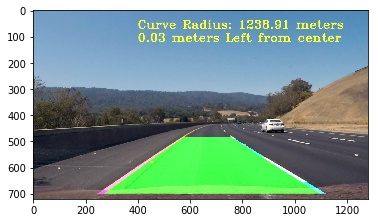

In [238]:
img_out = draw_lanes(img, img_b, left_fit, right_fit, p_trans_inv)
l_curve, r_curve = calculate_curve(img_b, left_fit, right_fit,
                                   left_lane_inds, right_lane_inds)
c_distance = calculate_distance(img_b, left_fit, right_fit)
final_img = draw_info(img_out, l_curve, r_curve, c_distance)
print("Left curve: %f meters" % l_curve)
print("Right curve: %f meters" % r_curve)
mean_curve = (l_curve+r_curve)/2
print("Curve Radius: %f meters" % mean_curve)
print("Distance from center: %f meters" % c_distance)
plt.imshow(final_img)

In [239]:

# Generate lane lines for all test images.
test_images = glob.glob('./test_images/*.jpg')
base_output = "./output_images/"
disp_imgs = []
disp_labels = []

for i, fname in enumerate(test_images):
    print("processing image %s" % fname)
    file_name = fname.split('/')[-1]
    output = os.path.join(base_output, file_name)
    
    img = plt.imread(fname)
    img_b, p_trans, p_trans_inv = image_pipeline(img)
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = \
                    sliding_window_polyfit(img_b)
        
    img_out = draw_lanes(img, img_b, left_fit, right_fit, p_trans_inv)
    l_curve, r_curve = calculate_curve(img_b, left_fit, right_fit,
                                   left_lane_inds, right_lane_inds)
    c_distance = calculate_distance(img_b, left_fit, right_fit)
    final_img = draw_info(img_out, l_curve, r_curve, c_distance)
    print("Saving image: %s" % output)
    plt.imsave(output, final_img)
    
    disp_imgs.append(final_img)
    disp_labels.append(output)
print("Done")

processing image ./test_images/straight_lines1.jpg
Saving image: ./output_images/straight_lines1.jpg
processing image ./test_images/straight_lines2.jpg
Saving image: ./output_images/straight_lines2.jpg
processing image ./test_images/test1.jpg
Saving image: ./output_images/test1.jpg
processing image ./test_images/test2.jpg
Saving image: ./output_images/test2.jpg
processing image ./test_images/test3.jpg
Saving image: ./output_images/test3.jpg
processing image ./test_images/test4.jpg
Saving image: ./output_images/test4.jpg
processing image ./test_images/test5.jpg
Saving image: ./output_images/test5.jpg
processing image ./test_images/test6.jpg
Saving image: ./output_images/test6.jpg
Done


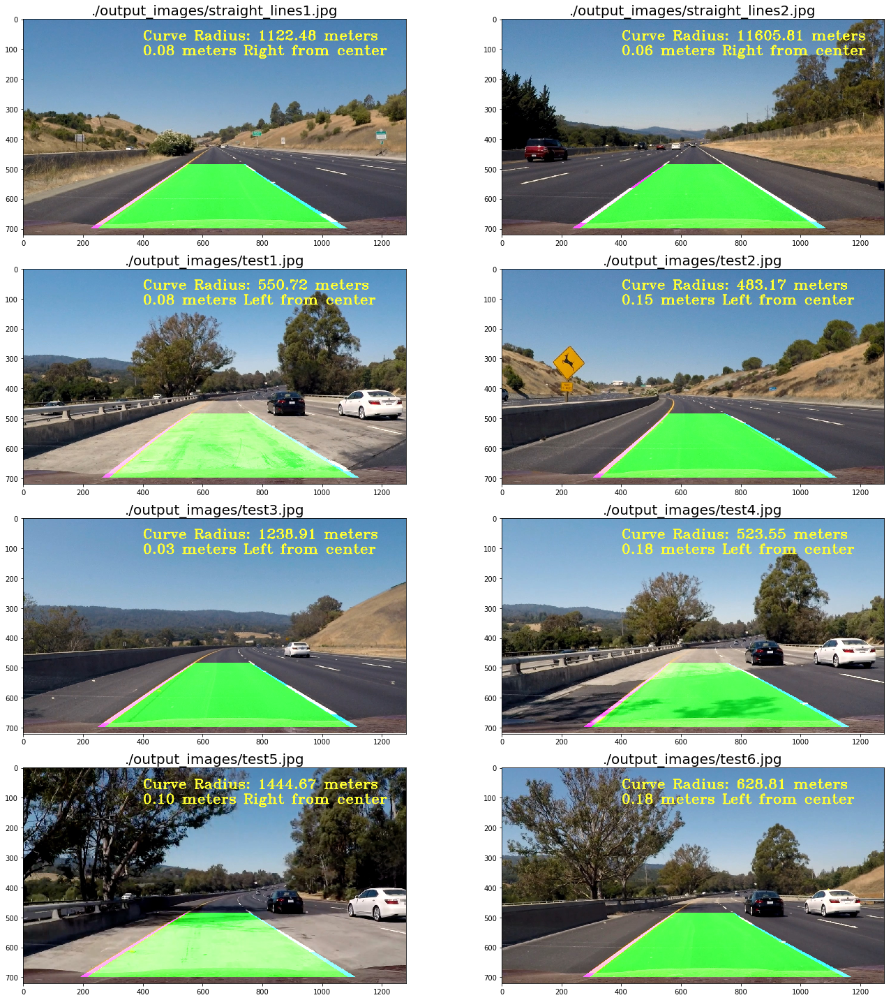

In [240]:
# Visualize all test images.
plot_images(disp_imgs, disp_labels, rows=4, cols=2)

In [241]:
# Instance of this is called from video processing method fl_image method.
class LaneLine():
    def __init__(self):
        # lane detected in last iteration.
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        # Average x values of the fitted line.
        self.bestx = None     
        # Averaged polynomial coefficients averaged.
        self.best_fit = None  
        # polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        # distance in meters of vehicle center from the line
        self.line_base_pos = None 
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        # number of detected pixels
        self.px_count = None
    # Ref jermey shannon idea understanding which fits are good 
    # for carry over when processing image of video.
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if ((self.diffs[0] > 0.001 or 
               self.diffs[1] > 1.0 or 
               self.diffs[2] > 100.) and 
               len(self.current_fit) > 0):
                    self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)

In [242]:
# Globals; Mostly for debug info.
inter_fail_cnt = 0
inter_diff = []
# Totoals can be seen from video ouput x/y format. y = Total.
def process_image(img):
    global inter_fail_cnt
    global inter_diff
    
    new_img = np.copy(img)
    img_bin, p_trans, p_trans_inv = image_pipeline(new_img)
    
    h = img.shape[0]
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window_polyfit(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_with_prev(img_bin,
                                                                   l_line.best_fit,
                                                                   r_line.best_fit)
    # invalidate both fits if the difference in their x-intercepts 
    # isn't around distance between their lanes is approximate delta (75).
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        # Save diffs for debugging.
        inter_diff.append(x_int_diff)
        if abs(lane_dist_px - x_int_diff) > delta_px:
            l_fit = None
            r_fit = None
            inter_fail_cnt += 1
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lanes(new_img, img_bin, l_line.best_fit,
                             r_line.best_fit, p_trans_inv)
        radius_l, radius_r = calculate_curve(img_bin,
                                        l_line.best_fit, r_line.best_fit, 
                                        l_lane_inds, r_lane_inds)
        c_distance =  calculate_distance(img_bin, l_line.best_fit, r_line.best_fit)
        
        img_out = draw_info(img_out1, radius_l, radius_r, c_distance)
    else:
        img_out = new_img
        
    return img_out

In [243]:
l_line = None
r_line = None

In [244]:
def create_video(input_file_name, output_file_name, reduce_speed=False):    
    """ Takes video file input and process images from video frame.
    Saves the final video file to destination.
    """
    # Debug info.
    global inter_fail_cnt
    inter_fail_cnt = 0
    global inter_diff
    inter_diff = []
    # Other globals.
    global l_line
    l_line = LaneLine()
    global r_line
    r_line = LaneLine()
    
    video_output = output_file_name
    video_input = VideoFileClip(input_file_name) #.subclip(0, 10)
    # reduce the speed of videos to 50%.
    if reduce_speed:
        video_input = video_input.speedx(0.5)
    processed_video = video_input.fl_image(process_image)
    processed_video.write_videofile(video_output, audio=False)
    

In [245]:
# Video 1.
create_video('project_video.mp4', './output_videos/project_video_output.mp4')

[MoviePy] >>>> Building video ./output_videos/project_video_output.mp4
[MoviePy] Writing video ./output_videos/project_video_output.mp4


100%|█████████▉| 1260/1261 [37:22<00:01,  1.04s/it]   


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/project_video_output.mp4 



In [254]:
# Debug info.
#print("Project video")
#print("Intercept fail count: %d" % inter_fail_cnt )
#print("Intercept diffs: %r" % inter_diff)

In [247]:
# Challenge video
# Source seems to be long here. Trying with different source.
# No a great way to update specific for roads. 
# Needs to be deterministic.
create_video('challenge_video.mp4', './output_videos/challenge_video_output.mp4',reduce_speed=True )

[MoviePy] >>>> Building video ./output_videos/challenge_video_output.mp4
[MoviePy] Writing video ./output_videos/challenge_video_output.mp4


100%|██████████| 969/969 [14:58<00:00,  1.08it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/challenge_video_output.mp4 



In [249]:
# Harder challenge video

create_video('harder_challenge_video.mp4', './output_videos/harder_challenge_video_output.mp4' )

[MoviePy] >>>> Building video ./output_videos/harder_challenge_video_output.mp4
[MoviePy] Writing video ./output_videos/harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [19:31<00:00,  1.03it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/harder_challenge_video_output.mp4 

